# Table of Contents
 <p><div class="lev1 toc-item"><a href="#载入数据并整合" data-toc-modified-id="载入数据并整合-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>载入数据并整合</a></div><div class="lev1 toc-item"><a href="#数据质量描述" data-toc-modified-id="数据质量描述-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>数据质量描述</a></div><div class="lev1 toc-item"><a href="#基于26台设备11.01-11.20的数据初步分析" data-toc-modified-id="基于26台设备11.01-11.20的数据初步分析-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>基于26台设备11.01-11.20的数据初步分析</a></div>

# 载入数据并整合

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
%matplotlib inline
plt.style.use('ggplot')

dir_path = os.path.dirname(os.getcwd())  #获取上一级目录
file_list = os.listdir(dir_path+'/20171120')
data_example = pd.read_csv('example.csv')
data_bts = []
for file in file_list:
    data_temp = pd.read_csv(dir_path+'/20171120/'+file)
    data_temp.columns = list(data_example.columns)
    data_bts.append(data_temp)
data_bts = pd.concat(data_bts).reset_index(drop=True)
#月份有的为00，从正常数据里抽取出来
data_abnormal = data_bts[data_bts.Time.apply(lambda x:x.split('-')[1]) == '00']  #时间异常的数据
data_bts = data_bts[data_bts.Time.apply(lambda x:x.split('-')[1]) != '00']
#时间转为pandas的时间序列
data_bts['Time'] = pd.to_datetime(data_bts.Time)

/Users/zhangyu/anaconda/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2728: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# 数据质量描述

In [2]:
#设备在2017.10.01至2017.11.30期间内有数据的天数以及每天的人流量情况
device_list = list(data_bts.DeviceCode.unique())
data_bts['date'] = data_bts.Time.dt.date
data_bts = data_bts[data_bts.Time>pd.to_datetime('2017-10-01')]

def flow_day(frame):
    frame['flow_day'] = frame.HumanFlow.sum()
    return frame
data_bts = data_bts.groupby(['DeviceCode','date']).apply(flow_day).reset_index(drop=True)
data_bts_temp = data_bts[['DeviceCode','date','flow_day']].drop_duplicates()

fig = plt.figure(figsize=(64,120),dpi=200)
for i in range(len(device_list)):
    ax = fig.add_subplot(30, 2, i+1)
    data_temp = data_bts_temp[data_bts.DeviceCode == device_list[i]]
    ax.bar(data_temp.date, height=1)
    ax.set_title(str(device_list[i]))
    ax.set_xlim(pd.to_datetime('2017-10-01'), pd.to_datetime('2017-11-30'))

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  from ipykernel import kernelapp as app


In [23]:
fig = plt.figure(figsize=(24,90),dpi=200)
for i in range(len(device_list)):
    ax = fig.add_subplot(30, 2, i+1)
    data_temp = data_bts_temp[data_bts.DeviceCode == device_list[i]]
    data_temp = data_temp.sort_values('date')
    ax.bar(data_temp.date, height=data_temp.flow_day)
    ax.set_title(str(device_list[i]))
    ax.set_xlim(pd.to_datetime('2017-10-01'), pd.to_datetime('2017-11-30'))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


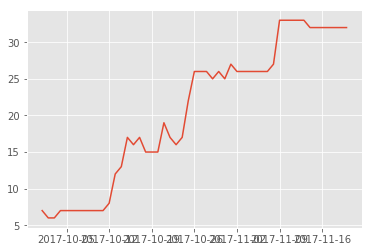

In [4]:
data_bts_temp = data_bts_temp[data_bts_temp.flow_day > 0]  #剔除人流量为0的天数
device_date = data_bts_temp.groupby('date').apply(len)
plt.plot(device_date)

/Users/zhangyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


66100036588920

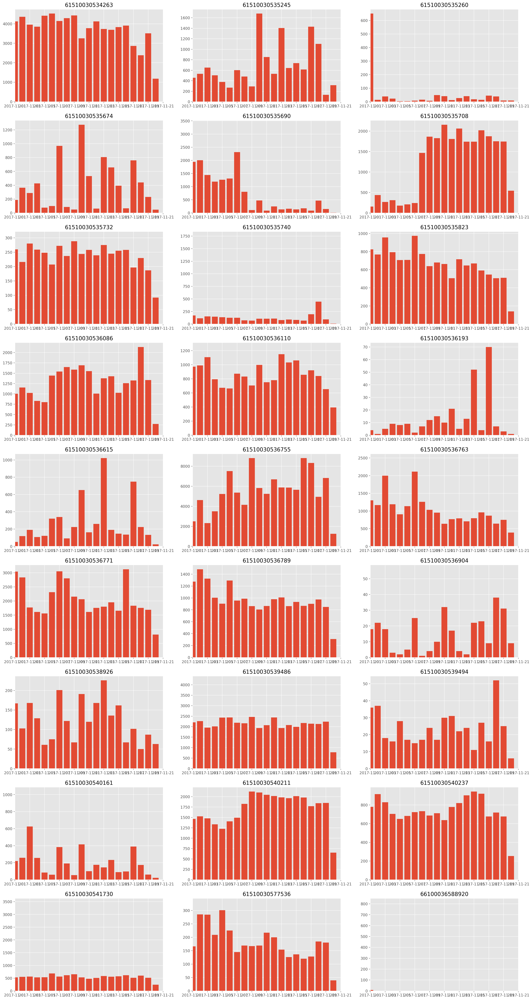

In [5]:
#选取11.01-11.20有完整数据的设备
device_list = list(data_bts_temp[data_bts_temp.date == pd.to_datetime('2017-11-01').date()].DeviceCode.unique())
fig = plt.figure(figsize=(24,48),dpi=200)
for i in range(len(device_list)):
    ax = fig.add_subplot(9, 3, i+1)
    data_temp = data_bts_temp[data_bts.DeviceCode == device_list[i]]
    data_temp = data_temp.sort_values('date')
    ax.bar(data_temp.date, height=data_temp.flow_day)
    ax.set_title(str(device_list[i]))
    ax.set_xlim(pd.to_datetime('2017-11-01'), pd.to_datetime('2017-11-21'))
device_list.pop()  #删除异常设备

# 基于26台设备11.01-11.20的数据初步分析

In [31]:
data_complete = data_bts[data_bts.DeviceCode.isin(device_list)]
data_complete = data_complete[data_complete.Time > pd.to_datetime('2017-11-01')]
data_complete = data_complete[data_complete.Time < pd.to_datetime('2017-11-20')]
#添加时间窗
tw_span = 15
data_complete['tw_all'] = data_complete.Time.apply(lambda x:(x - pd.to_datetime('2017-11-01 00:00:00'))//pd.Timedelta(str(tw_span)+'min'))
data_complete['tw'] = data_complete.tw_all % (24*60/tw_span)
'''
fig = plt.figure(figsize=(15,90),dpi=200)
for i in range(len(device_list)):
    ax = fig.add_subplot(26,1,i+1)
    data_temp = data_complete[data_complete.DeviceCode==device_list[i]]
    data_temp = data_temp.sort_values('Time')
    ax.plot(data_temp.Time, data_temp.HumanFlow)
    ax.set_title(str(device_list[i]))
'''

"\nfig = plt.figure(figsize=(15,90),dpi=200)\nfor i in range(len(device_list)):\n    ax = fig.add_subplot(26,1,i+1)\n    data_temp = data_complete[data_complete.DeviceCode==device_list[i]]\n    data_temp = data_temp.sort_values('Time')\n    ax.plot(data_temp.Time, data_temp.HumanFlow)\n    ax.set_title(str(device_list[i]))\n"

In [32]:
#时间窗内人数求和加总
def human_flow_sum(frame):
    frame['HumanFlowTw'] = frame.HumanFlow.sum()
    return frame
data_complete = data_complete.groupby(['DeviceCode','tw_all']).apply(human_flow_sum).reset_index(drop=True)

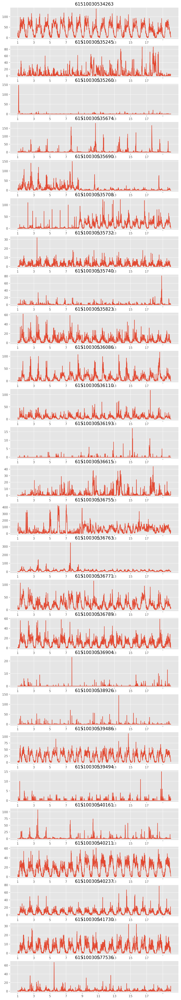

In [73]:
data_complete_human = data_complete[['DeviceCode','date','tw_all','tw','HumanFlowTw']]
data_complete_human.columns = ['DeviceCode','date','tw_all','tw','HumanFlow']
data_complete_human = data_complete_human.drop_duplicates()
data_complete_human['date'] = pd.to_datetime(data_complete_human.date)
def draw_flow(data, tw_span, device_list, figsize=(10,60),tw_s=0, tw_e=0):
    #设定绘制时间窗的初始值
    if tw_s==0 and tw_e==0:
        tw_s = data.tw_all.min()
        tw_e = data.tw_all.max()
    data = data[data.tw_all <= tw_e]
    data = data[data.tw_all >= tw_s]
    fig = plt.figure(figsize=figsize,dpi=200)
    m = len(device_list)
    for i in range(m):
        ax = fig.add_subplot(m,1,i+1)
        data_temp = data[data.DeviceCode==device_list[i]]
        data_temp = data_temp.sort_values('tw_all')
        ax.plot(data_temp.tw_all, data_temp.HumanFlow)
        ax.set_title(str(device_list[i]))
        ax.set_xticks(np.arange(tw_s,tw_e,2*60*24/tw_span))
        ax.set_xticklabels(np.arange(1,tw_e//int(60*24/tw_span),2))
draw_flow(data_complete_human, 15, device_list)

In [74]:
#得到每天的正常人流
def get_baseline(data):
    return data['HumanFlow'].mean()
def get_variance(data):
    #去除疑似异常值
    m = data.shape[0]
    data = data.sort_values('HumanFlow').reset_index(drop=True)
    q1 = data.HumanFlow.iloc[int(m/4)]
    q3 = data.HumanFlow.iloc[int(m*3/4)]
    iqr = q3 - q1
    if iqr != 0:
        data = data[data.HumanFlow > q1-1.5*iqr]
        data = data[data.HumanFlow < q3+1.5*iqr]
    return np.sqrt(data['HumanFlow'].var())

data_baseline = data_complete_human.groupby(['DeviceCode','tw']).apply(get_baseline).reset_index(name='HumanFlow')
data_variance = data_complete_human.groupby(['DeviceCode','tw']).apply(get_variance).reset_index(name='sigma')
data_baseline['sigma'] = data_variance['sigma']

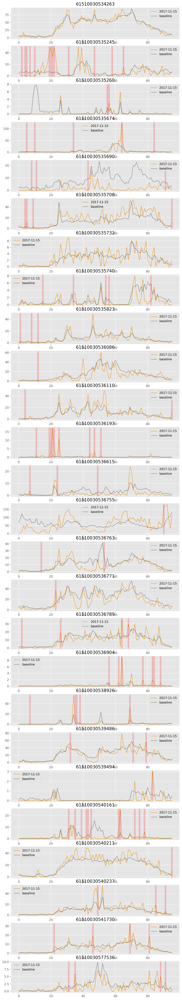

In [101]:
#简单应用3sigma原则判断是否异常
#传进来一天的数据
def is_abnormal(data, baseline):
    data['abnormal'] = (np.abs(baseline.HumanFlow - data.HumanFlow) - 3*baseline.sigma) > 0
    tw = list(data[data.abnormal].tw)
    return tw

def draw_day(data, date, baseline, figsize=(10,60)):
    data = data[data.date == pd.to_datetime(date)]
    fig = plt.figure(figsize=figsize,dpi=200)
    m = len(device_list)
    for i in range(m):
        ax = fig.add_subplot(m,1,i+1)
        data_temp = data[data.DeviceCode==device_list[i]]
        data_temp = data_temp.sort_values('tw').reset_index(drop=True)
        baseline_temp = baseline[baseline.DeviceCode==device_list[i]]
        baseline_temp = baseline_temp.sort_values('tw').reset_index(drop=True)
        abnormal_tw = is_abnormal(data_temp, baseline_temp)
        
        if baseline_temp.HumanFlow.max() > data_temp.HumanFlow.max():
            human_max = baseline_temp.HumanFlow.max()
        else:
            human_max = data_temp.HumanFlow.max()

        ax.plot(data_temp.tw, data_temp.HumanFlow, label=date, c=(0.92,0.55,0), linewidth=1)
        ax.plot(baseline_temp.tw, baseline_temp.HumanFlow, label='baseline', c='black', linewidth=1, alpha=0.5)
        for j in range(len(abnormal_tw)):
            tw = abnormal_tw[j]
            ax.plot([tw,tw],[0, human_max], c='red', alpha=0.2, linewidth=5)
        ax.set_title(str(device_list[i]))
        ax.legend()

draw_day(data_complete_human, '2017-11-15', data_baseline)

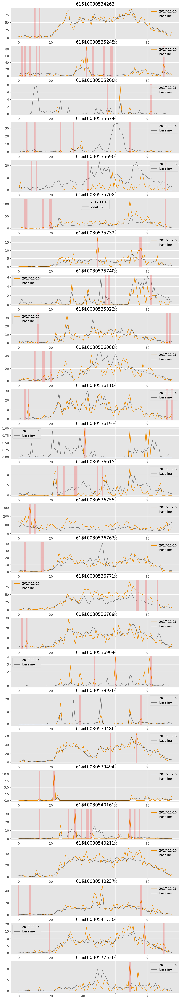

In [103]:
draw_day(data_complete_human, '2017-11-16', data_baseline)

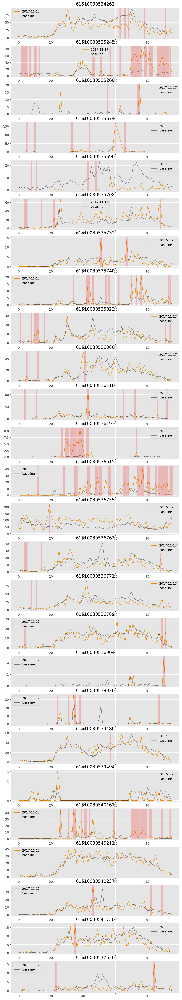

In [102]:
draw_day(data_complete_human, '2017-11-17', data_baseline)